In [1]:
import sys
path='C:/Users/GE702PL/Desktop/PYTHON/_PYTHON_PROJECTS/SantanderCustomerTransactionPrediction'
sys.path.append(path)

from importlib import reload 
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import pck_santander

# Loading data  

We will load the train data from:  
https://www.kaggle.com/c/santander-customer-transaction-prediction/data

In [8]:
filename='C:/Users/GE702PL/Desktop/PYTHON/_PYTHON_PROJECTS/SantanderCustomerTransactionPrediction/_data/train.csv'
data=pck_santander.LoadDataset(filename=filename)
df=data.get_randomdata(n=200)  # The model is constructed and tested on a sample of 200 rows.
# df=data.get_data()  # The whole dataset.
df

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
175849,0,9.0811,3.2189,9.2037,3.9626,14.4787,0.7330,6.2688,16.8901,3.6949,...,1.9716,4.5985,2.6025,3.5572,21.5915,0.8395,6.4172,8.3754,15.5981,0.8385
42228,1,15.0627,-4.7010,10.0067,7.6645,9.6818,-8.5444,6.8171,14.9408,-4.9104,...,5.1468,0.4714,3.3631,3.9882,11.8331,1.1968,-5.8845,9.0244,16.6640,-25.6990
28855,0,4.5211,-2.0182,9.0497,7.5144,13.1524,-9.1160,4.8278,19.6409,2.4651,...,0.4605,4.8296,1.7714,4.4462,16.7817,-2.0184,-5.0391,9.5756,14.0541,3.5221
123271,0,7.0862,-6.3578,6.9814,5.2260,8.5545,-3.9462,6.6880,13.7023,-4.2152,...,3.1294,3.8219,0.0317,-0.6866,21.4378,-3.2195,-5.7492,7.9969,17.0249,13.1874
142259,0,7.8751,-8.7133,7.8706,5.7368,8.9069,5.1403,4.5817,23.0549,1.0582,...,-0.0181,11.2119,-0.1704,4.9645,15.3917,-0.2154,4.4224,9.1969,13.6099,-11.6257
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50609,0,12.0613,-4.8316,8.7249,5.9989,10.3566,1.6244,3.3970,23.2439,2.0938,...,10.7512,1.6662,0.0712,-1.9507,14.2527,3.3825,2.3442,9.3586,17.9897,8.7591
39701,0,6.5347,-4.3317,7.0886,6.6398,10.4247,1.0787,5.2146,16.4606,-1.3646,...,-0.0572,6.4728,0.9813,5.7236,18.0061,1.5097,5.4145,8.5512,13.2813,2.4013
69470,0,11.7628,-6.9699,13.5754,7.7146,8.3051,-5.7706,5.3278,23.8108,0.5448,...,8.1492,8.3548,2.7587,8.1035,13.6004,-0.1907,9.5852,9.8182,14.8681,-7.6196
98059,1,9.6172,-0.4881,10.0443,6.7040,11.2684,13.2648,3.7141,20.1713,4.2599,...,3.6214,8.3902,4.8274,7.0959,15.9308,-2.9079,0.6763,9.7622,18.8231,-15.6236


# Preprocessing  

Quick analysis of the data shows the following:
- there are no missing values;
- there are only numerical values in the dataset;
- the only variable which can be categorical is the target variable;
- some variables have negative minimum values;
- the distributions of the variables except for the target variable appears to be Normal based on visual analysis.

NaNs:  []
Unique formats:  [dtype('int64'), dtype('float64')]
Possibly categorical variables (<10 unique values):  ['target']
Min value < 0:  ['var_1', 'var_5', 'var_8', 'var_10', 'var_11', 'var_13', 'var_17', 'var_18', 'var_19', 'var_21', 'var_22', 'var_26', 'var_27', 'var_29', 'var_30', 'var_32', 'var_35', 'var_36', 'var_39', 'var_40', 'var_41', 'var_44', 'var_45', 'var_47', 'var_48', 'var_49', 'var_51', 'var_52', 'var_54', 'var_58', 'var_61', 'var_62', 'var_63', 'var_65', 'var_67', 'var_69', 'var_70', 'var_71', 'var_72', 'var_74', 'var_76', 'var_80', 'var_82', 'var_83', 'var_84', 'var_86', 'var_87', 'var_89', 'var_90', 'var_95', 'var_96', 'var_97', 'var_98', 'var_99', 'var_100', 'var_107', 'var_110', 'var_112', 'var_113', 'var_115', 'var_116', 'var_117', 'var_118', 'var_119', 'var_120', 'var_122', 'var_123', 'var_124', 'var_127', 'var_128', 'var_131', 'var_134', 'var_135', 'var_136', 'var_137', 'var_138', 'var_139', 'var_140', 'var_141', 'var_142', 'var_145', 'var_147', 'var_149', '

([], True, True, True)

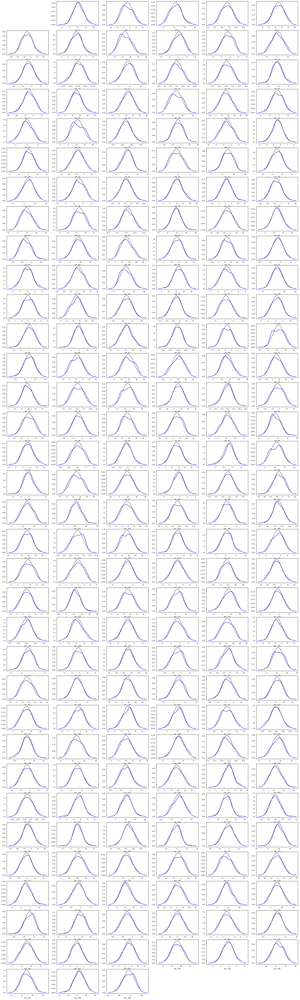

In [3]:
data4preprocessing = pck_santander.Preprocess(df)
data4preprocessing.get_summary()

## Outliers analysis  

Next, we can check for possible outliers. As the distributions of the variables are pretty symmetrical, this can be done using one of the following methods:
- z-score;  
- interquartile range (IQR).

The analysis of the outliers is based on all the variables except the target one.

The outliers are marked on the plots by a red cross.

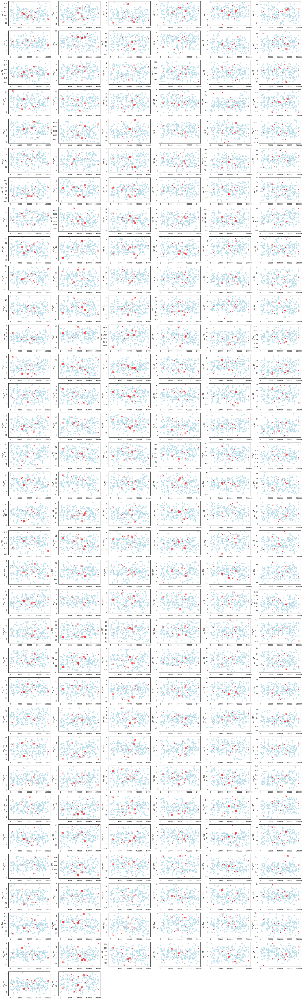

In [18]:
df_clean, df_outliers, df = pck_santander.Outliers(df).show(df.columns[1:-1], 
                                                                how='z_score', 
                                                                show_plot=True, 
                                                                threshold=3)


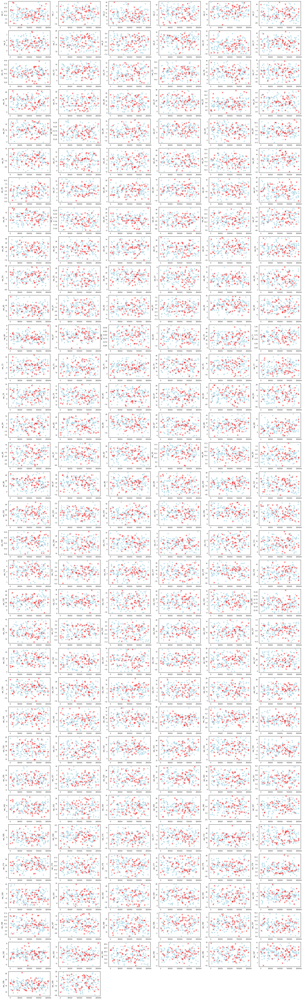

In [19]:
df_clean, df_outliers, df = pck_santander.Outliers(df).show(df.columns[1:-1], 
                                                                how='IQR', 
                                                                show_plot=True, 
                                                                q1=0.25)

We can see that there are much more outliers found using the IQR method than using the z-score method.  

**Which method is the most appropriate?**

Z-score depends on non-robust measures, however the mean and standard deviation are affected by outliers, so they are not robust. Some of the distribution plots which we saw earlier are skewed, so this method may be not reliable enough. Thus, we will use the results of the ***IQR method***.  

We can check the dataset with outliers removed:

NaNs:  []
Unique formats:  [dtype('int64'), dtype('float64'), dtype('bool')]
Possibly categorical variables (<10 unique values):  ['target', 'outliers']
Min value < 0:  ['var_1', 'var_5', 'var_8', 'var_10', 'var_11', 'var_13', 'var_17', 'var_19', 'var_21', 'var_22', 'var_26', 'var_27', 'var_29', 'var_30', 'var_32', 'var_35', 'var_36', 'var_39', 'var_40', 'var_41', 'var_44', 'var_45', 'var_47', 'var_48', 'var_51', 'var_52', 'var_54', 'var_58', 'var_61', 'var_62', 'var_63', 'var_65', 'var_67', 'var_69', 'var_70', 'var_71', 'var_72', 'var_74', 'var_76', 'var_80', 'var_82', 'var_83', 'var_84', 'var_86', 'var_87', 'var_89', 'var_90', 'var_95', 'var_96', 'var_97', 'var_99', 'var_100', 'var_110', 'var_113', 'var_115', 'var_116', 'var_117', 'var_118', 'var_119', 'var_122', 'var_123', 'var_124', 'var_127', 'var_128', 'var_131', 'var_134', 'var_135', 'var_136', 'var_137', 'var_138', 'var_139', 'var_140', 'var_141', 'var_142', 'var_145', 'var_147', 'var_149', 'var_154', 'var_155', 'var_157', 'var

([], True, True, True)

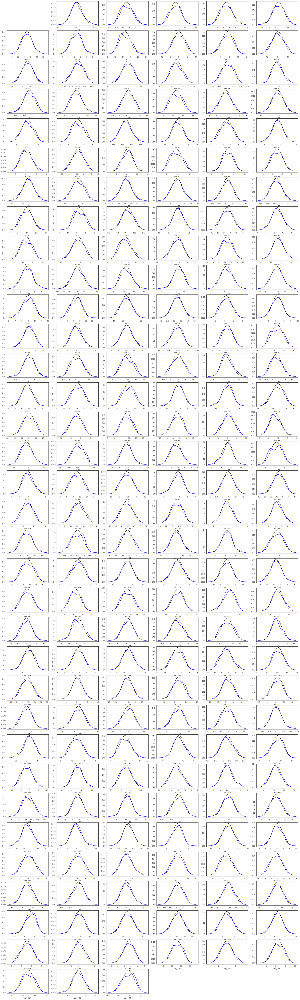

In [6]:
data4preprocessing = pck_santander.Preprocess(df_clean)
data4preprocessing.get_summary()

In [17]:
reload(pck_santander)

<module 'pck_santander' from 'C:\\Users\\GE702PL\\Desktop\\PYTHON\\_PYTHON_PROJECTS\\SantanderCustomerTransactionPrediction\\_latest\\pck_santander\\__init__.py'>